In [2]:
import pandas as pd
df = pd.read_json ('C:/Users/Pooja/Downloads/reviews_Clothing_Shoes_and_Jewelry_5.json/Clothing_Shoes_and_Jewelry_5.json', lines= True)

In [3]:
df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A1KLRMWW2FWPL4,0000031887,"Amazon Customer ""cameramom""","[0, 0]",This is a great tutu and at a really great pri...,5,Great tutu- not cheaply made,1297468800,"02 12, 2011"
1,A2G5TCU2WDFZ65,0000031887,Amazon Customer,"[0, 0]",I bought this for my 4 yr old daughter for dan...,5,Very Cute!!,1358553600,"01 19, 2013"
2,A1RLQXYNCMWRWN,0000031887,Carola,"[0, 0]",What can I say... my daughters have it in oran...,5,I have buy more than one,1357257600,"01 4, 2013"
3,A8U3FAMSJVHS5,0000031887,Caromcg,"[0, 0]","We bought several tutus at once, and they are ...",5,"Adorable, Sturdy",1398556800,"04 27, 2014"
4,A3GEOILWLK86XM,0000031887,CJ,"[0, 0]",Thank you Halo Heaven great product for Little...,5,Grammy's Angels Love it,1394841600,"03 15, 2014"
...,...,...,...,...,...,...,...,...,...
278672,A2DG63DN704LOI,B00KKXCJQU,ESlayd,"[0, 1]",I don't normally go ga-ga over a product very ...,5,These have literally changed the way I travel!,1403568000,"06 24, 2014"
278673,A1EVV74UQYVKRY,B00KKXCJQU,K. Groh,"[0, 0]",I've been traveling back and forth to England ...,5,Wonderful for Better Packing,1403740800,"06 26, 2014"
278674,A1UQBFCERIP7VJ,B00KKXCJQU,Margaret Picky,"[1, 1]",These are very nice packing cubes and the 18 x...,5,"Convenient, lightweight, and durable",1402185600,"06 8, 2014"
278675,A22CW0ZHY3NJH8,B00KKXCJQU,Noname,"[2, 2]",I am on vacation with my family of four and th...,5,Holds Up Well In Real World Test,1404691200,"07 7, 2014"


In [4]:
df.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [5]:
df['reviews']=df['reviewText']+df['summary']
df=df.drop(['reviewText', 'summary'], axis=1)
df.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews
0,A1KLRMWW2FWPL4,0000031887,"Amazon Customer ""cameramom""","[0, 0]",5,1297468800,"02 12, 2011",This is a great tutu and at a really great pri...
1,A2G5TCU2WDFZ65,0000031887,Amazon Customer,"[0, 0]",5,1358553600,"01 19, 2013",I bought this for my 4 yr old daughter for dan...
2,A1RLQXYNCMWRWN,0000031887,Carola,"[0, 0]",5,1357257600,"01 4, 2013",What can I say... my daughters have it in oran...
3,A8U3FAMSJVHS5,0000031887,Caromcg,"[0, 0]",5,1398556800,"04 27, 2014","We bought several tutus at once, and they are ..."
4,A3GEOILWLK86XM,0000031887,CJ,"[0, 0]",5,1394841600,"03 15, 2014",Thank you Halo Heaven great product for Little...


In [6]:
def f(row):
    
    '''This function returns sentiment value based on the overall ratings from the user'''
    
    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] == 1.0 or row['overall'] == 2.0:
        val = 'Negative'
    elif row['overall'] == 4.0 or row['overall'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [7]:
#Applying the function in our new column
df['sentiment'] = df.apply(f, axis=1)
df.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews,sentiment
0,A1KLRMWW2FWPL4,0000031887,"Amazon Customer ""cameramom""","[0, 0]",5,1297468800,"02 12, 2011",This is a great tutu and at a really great pri...,Positive
1,A2G5TCU2WDFZ65,0000031887,Amazon Customer,"[0, 0]",5,1358553600,"01 19, 2013",I bought this for my 4 yr old daughter for dan...,Positive
2,A1RLQXYNCMWRWN,0000031887,Carola,"[0, 0]",5,1357257600,"01 4, 2013",What can I say... my daughters have it in oran...,Positive
3,A8U3FAMSJVHS5,0000031887,Caromcg,"[0, 0]",5,1398556800,"04 27, 2014","We bought several tutus at once, and they are ...",Positive
4,A3GEOILWLK86XM,0000031887,CJ,"[0, 0]",5,1394841600,"03 15, 2014",Thank you Halo Heaven great product for Little...,Positive


In [8]:
df['sentiment'].value_counts()

Positive    221597
Neutral      30425
Negative     26655
Name: sentiment, dtype: int64

In [9]:
df2 = pd.DataFrame(df['helpful'])


df2[['helpful','total']] = pd.DataFrame(df2.helpful.values.tolist(), index=df2.index)
df2

,helpful,total
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
278672,0,1
278673,0,0
278674,1,1
278675,2,2


In [10]:
df = df.drop('helpful',1)

In [11]:
try:
  df2['result'] = df2['helpful']/df2['total']
except ZeroDivisionError:
  df2['result']=0

In [12]:
#Filling the NaN values(created due to dividing) with 0
df2['result'] = df2['result'].fillna(0)

#Rounding of the results to two decimal places
df2['result']=df2['result'].round(2) 
df2['result']

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
278672    0.0
278673    0.0
278674    1.0
278675    1.0
278676    0.0
Name: result, Length: 278677, dtype: float64

In [13]:
df2['result'].value_counts()

0.00    202893
1.00     52304
0.50      7275
0.67      3270
0.75      2475
         ...  
0.16         1
0.15         1
0.39         1
0.34         1
0.59         1
Name: result, Length: 91, dtype: int64

In [14]:
df['helpful_rate'] = df2['result']

In [15]:
df

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviewTime,reviews,sentiment,helpful_rate
0,A1KLRMWW2FWPL4,0000031887,"Amazon Customer ""cameramom""",5,1297468800,"02 12, 2011",This is a great tutu and at a really great pri...,Positive,0.0
1,A2G5TCU2WDFZ65,0000031887,Amazon Customer,5,1358553600,"01 19, 2013",I bought this for my 4 yr old daughter for dan...,Positive,0.0
2,A1RLQXYNCMWRWN,0000031887,Carola,5,1357257600,"01 4, 2013",What can I say... my daughters have it in oran...,Positive,0.0
3,A8U3FAMSJVHS5,0000031887,Caromcg,5,1398556800,"04 27, 2014","We bought several tutus at once, and they are ...",Positive,0.0
4,A3GEOILWLK86XM,0000031887,CJ,5,1394841600,"03 15, 2014",Thank you Halo Heaven great product for Little...,Positive,0.0
...,...,...,...,...,...,...,...,...,...
278672,A2DG63DN704LOI,B00KKXCJQU,ESlayd,5,1403568000,"06 24, 2014",I don't normally go ga-ga over a product very ...,Positive,0.0
278673,A1EVV74UQYVKRY,B00KKXCJQU,K. Groh,5,1403740800,"06 26, 2014",I've been traveling back and forth to England ...,Positive,0.0
278674,A1UQBFCERIP7VJ,B00KKXCJQU,Margaret Picky,5,1402185600,"06 8, 2014",These are very nice packing cubes and the 18 x...,Positive,1.0
278675,A22CW0ZHY3NJH8,B00KKXCJQU,Noname,5,1404691200,"07 7, 2014",I am on vacation with my family of four and th...,Positive,1.0


In [16]:
#Removing unnecessary columns
df=df.drop(['reviewerName','unixReviewTime'], axis=1)
#Creating a copy 
clean_reviews=df.copy()

In [17]:
df

,reviewerID,asin,overall,reviewTime,reviews,sentiment,helpful_rate
0,A1KLRMWW2FWPL4,0000031887,5,"02 12, 2011",This is a great tutu and at a really great pri...,Positive,0.0
1,A2G5TCU2WDFZ65,0000031887,5,"01 19, 2013",I bought this for my 4 yr old daughter for dan...,Positive,0.0
2,A1RLQXYNCMWRWN,0000031887,5,"01 4, 2013",What can I say... my daughters have it in oran...,Positive,0.0
3,A8U3FAMSJVHS5,0000031887,5,"04 27, 2014","We bought several tutus at once, and they are ...",Positive,0.0
4,A3GEOILWLK86XM,0000031887,5,"03 15, 2014",Thank you Halo Heaven great product for Little...,Positive,0.0
...,...,...,...,...,...,...,...
278672,A2DG63DN704LOI,B00KKXCJQU,5,"06 24, 2014",I don't normally go ga-ga over a product very ...,Positive,0.0
278673,A1EVV74UQYVKRY,B00KKXCJQU,5,"06 26, 2014",I've been traveling back and forth to England ...,Positive,0.0
278674,A1UQBFCERIP7VJ,B00KKXCJQU,5,"06 8, 2014",These are very nice packing cubes and the 18 x...,Positive,1.0
278675,A22CW0ZHY3NJH8,B00KKXCJQU,5,"07 7, 2014",I am on vacation with my family of four and th...,Positive,1.0


In [18]:
import re, string
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [19]:
df['reviews']=df['reviews'].apply(lambda x:review_cleaning(x))
df.head()

,reviewerID,asin,overall,reviewTime,reviews,sentiment,helpful_rate
0,A1KLRMWW2FWPL4,0000031887,5,"02 12, 2011",this is a great tutu and at a really great pri...,Positive,0.0
1,A2G5TCU2WDFZ65,0000031887,5,"01 19, 2013",i bought this for my yr old daughter for danc...,Positive,0.0
2,A1RLQXYNCMWRWN,0000031887,5,"01 4, 2013",what can i say my daughters have it in orange ...,Positive,0.0
3,A8U3FAMSJVHS5,0000031887,5,"04 27, 2014",we bought several tutus at once and they are g...,Positive,0.0
4,A3GEOILWLK86XM,0000031887,5,"03 15, 2014",thank you halo heaven great product for little...,Positive,0.0


In [20]:
stop_words= ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each', 
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above', 
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't", 
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from', 
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs', 
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [21]:
df['reviews'] = df['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))


In [22]:
pd.DataFrame(df.groupby('sentiment')['helpful_rate'].mean())

,helpful_rate
sentiment,
Negative,0.303886
Neutral,0.249260
Positive,0.235574


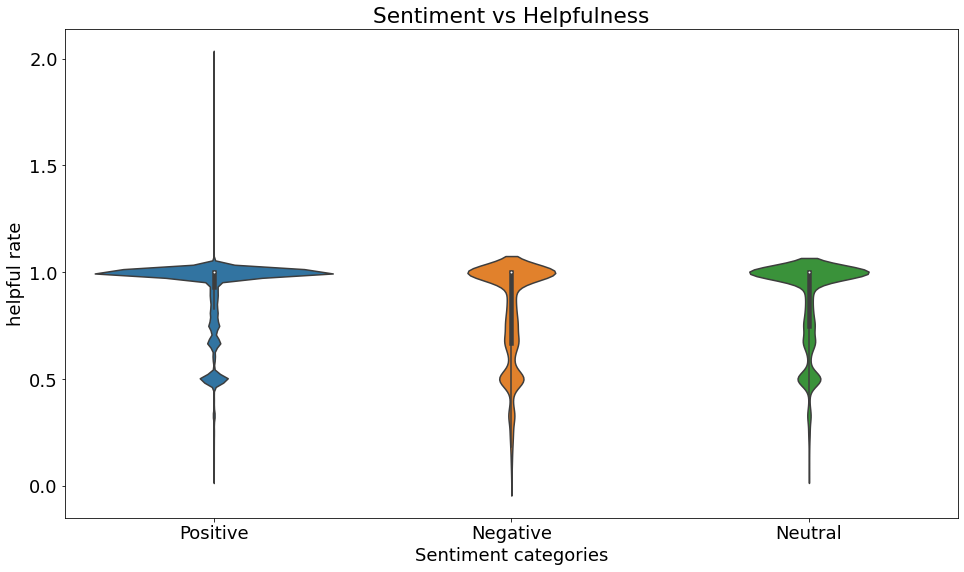

In [23]:
#plot layout
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
plt.rcParams.update({'font.size': 18})
rcParams['figure.figsize'] = 16,9

# Creating dataframe and removing 0 helpfulrate records
senti_help= pd.DataFrame(df, columns = ['sentiment', 'helpful_rate'])
senti_help = senti_help[senti_help['helpful_rate'] != 0.00] 

#Plotting phase
sns.violinplot( x=senti_help["sentiment"], y=senti_help["helpful_rate"])
plt.title('Sentiment vs Helpfulness')
plt.xlabel('Sentiment categories')
plt.ylabel('helpful rate')
plt.show()

In [24]:
from textblob import TextBlob
df['polarity'] = df['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)
df['review_len'] = df['reviews'].astype(str).apply(len)
df['word_count'] = df['reviews'].apply(lambda x: len(str(x).split()))

In [25]:
df.head()

,reviewerID,asin,overall,reviewTime,reviews,sentiment,helpful_rate,polarity,review_len,word_count
0,A1KLRMWW2FWPL4,0000031887,5,"02 12, 2011",great tutu really great price doesnt look chea...,Positive,0.0,0.316667,137,23
1,A2G5TCU2WDFZ65,0000031887,5,"01 19, 2013",bought yr old daughter dance class wore today ...,Positive,0.0,0.400000,186,30
2,A1RLQXYNCMWRWN,0000031887,5,"01 4, 2013",say daughters orange black white pink thinking...,Positive,0.0,0.361742,207,34
3,A8U3FAMSJVHS5,0000031887,5,"04 27, 2014",bought several tutus got high reviews sturdy s...,Positive,0.0,-0.015556,258,40
4,A3GEOILWLK86XM,0000031887,5,"03 15, 2014",thank halo heaven great product little girls g...,Positive,0.0,0.354464,304,50


In [26]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [27]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [28]:
df['overall'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [29]:
%matplotlib inline

import sqlite3
import json
import csv
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import re

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin

from nltk.stem.porter import PorterStemmer

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from wordcloud import WordCloud, STOPWORDS

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Pooja\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


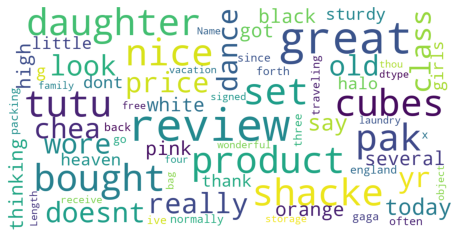

In [30]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords

stopwords = list(stopwords.words('english'))


#mpl.rcParams['figure.figsize']=(8.0,6.0)    #(6.0,4.0)
mpl.rcParams['font.size']=12                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(8, 8))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(df["reviews"])

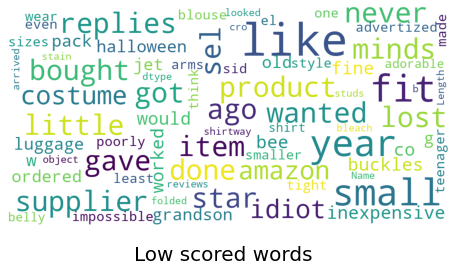

In [31]:
show_wordcloud(df[df.overall == 1]["reviews"], title = "Low scored words")

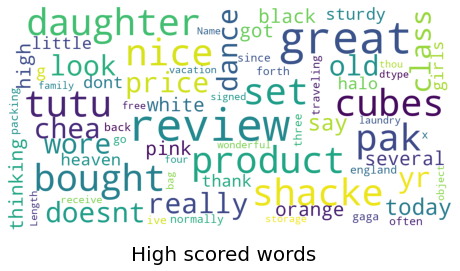

In [32]:
show_wordcloud(df[df.overall == 5]["reviews"], title = "High scored words")

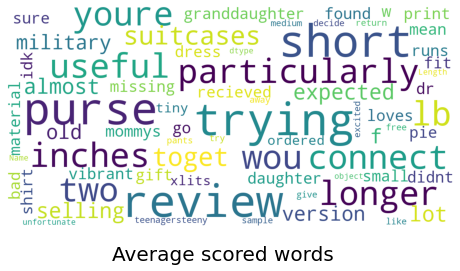

In [33]:
show_wordcloud(df[df.overall == 2]["reviews"], title = "Average scored words")

In [34]:
# calling the label encoder function
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
df['sentiment']= label_encoder.fit_transform(df['sentiment']) 
  
df['sentiment'].unique() 

array([2, 1, 0])

In [35]:
df['sentiment'].value_counts()

2    221597
1     30425
0     26655
Name: sentiment, dtype: int64

In [36]:
#Extracting 'reviews' for processing
review_features=df.copy()
review_features=review_features[['reviews']].reset_index(drop=True)
review_features.head()

,reviews
0,great tutu really great price doesnt look chea...
1,bought yr old daughter dance class wore today ...
2,say daughters orange black white pink thinking...
3,bought several tutus got high reviews sturdy s...
4,thank halo heaven great product little girls g...


In [37]:
#Performing stemming on the review dataframe
ps = PorterStemmer()

#splitting and adding the stemmed words except stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['reviews'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus.append(review)  

In [38]:
corpus[3]

'bought sever tutu got high review sturdi seemingli wellmad girl wear regularli includ play tutu stood well fit old old well clearli plenti room grow con kid pull off tutu wast band get twist adult untangl but not difficultador sturdi'

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['reviews'])

In [40]:
X.shape

(278677, 5000)

In [41]:
#Getting the target variable(encoded)
y=df['sentiment']

In [42]:
from imblearn.over_sampling import SMOTE

#print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

#print(f'Resampled dataset shape {Counter(y_res)}')

In [43]:
## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=0)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB 
from sklearn.model_selection import cross_val_score

#creating the objects
logreg_cv = LogisticRegression(random_state=0, max_iter=3000)
svc_cv=SVC()
nb_cv=BernoulliNB()
cv_dict = {0: 'Logistic Regression', 1: 'SVC',2:'Naive Bayes'}
cv_models=[logreg_cv,svc_cv,nb_cv]


for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

Logistic Regression Test Accuracy: 0.8331688771114288
